# Imports

In [ ]:
# CS180 (CS280A): Project 1 starter Python code

# these are just some suggested libraries
# instead of scikit-image you could use matplotlib and opencv to read, write, and display images

import numpy as np
import skimage as sk
import skimage.io as skio
import matplotlib.pyplot as plt
import math
import pandas as pd
import cv2

# Preprocessing

In [ ]:
# separate color channels
def split_channels(im):
  '''
  Split the image into its color channels.
  Assumes the image has 3 color channels with same height and are stacked vertically.
  returns b, g, r, where b, g, r are the 3 color channels
  '''
  # convert to double (might want to do this later on to save memory)
  im = sk.img_as_float(im)

  # compute the height of each part (just 1/3 of total)
  height = np.floor(im.shape[0] / 3.0).astype(int)
  b = im[:height]
  g = im[height: 2*height]
  r = im[2*height: 3*height]

  return b, g, r

In [ ]:
def im2uint8(img):
    # for 0 - 1 float
    if img.dtype == np.float32 or img.dtype == np.float64:
        return (img * 255).clip(0, 255).astype(np.uint8)
    # if uint16
    elif img.dtype == np.uint16:
        return (img / 257).astype(np.uint8)
    else:
        return img.astype(np.uint8)

In [ ]:
def normalize(im):
  '''
  returns the normalized image with values between 0 and 1
  assumes uint8
  '''
  return im.astype(np.float32) / 255.0

# Helper functions

In [ ]:
def crop_img(img, left=25, top=25, right=25, bottom=25):
    #return the cropped image with the specified number of pixels cropped

    # check that crop values are in bound
    if left < 0:
        left = 0
    if right > img.shape[1]:
        right = img.shape[1]
    if top < 0:
        top = 0
    if bottom > img.shape[0]:
        bottom = img.shape[0]

    return img[top:img.shape[0]-bottom, left:img.shape[1]-right]


In [ ]:
def get_sobel_edges(img1):
  '''
  returns the sobel edges in a uint8 format
  '''
  # denoise for cleaner edges
  img_blur1 = cv2.GaussianBlur(img1, (3, 3), 0)

  # sobel gradients
  gx1 = cv2.Sobel(img_blur1, cv2.CV_64F, 1, 0, ksize=3)  # d/dx
  gy1 = cv2.Sobel(img_blur1, cv2.CV_64F, 0, 1, ksize=3)  # d/dy

  # gradient magnitude
  mag1 = cv2.magnitude(gx1, gy1)

  # normalize to 8-bit for viewing/saving
  return np.uint8(255 * (mag1 / (mag1.max() + 1e-6)))

In [ ]:
def get_pyramid(img, levels=10):
  '''
  Returns the image pyramid of the given image with the specified levels
  If the 2**levels is larger than any dimension the None is returned.
  '''

  h, w = img.shape[0], img.shape[1]

  img_pyramid = []

  if 2**levels > h or 2**levels > w:
    print("Image too small")
    return

  for i in range(levels):
    img_pyramid.append(img[::2**i, ::2**i])

  return img_pyramid


In [ ]:
def compute_euclidian_distance(img1, img2):
  return sum(sum(np.square(img1-img2)))

In [ ]:
def align(img1, img2, search_area=15):
  # returns the vertical shift of img1 to img2 with the lowest euclidean distance

  print(img1.shape)
  print(img2.shape)
  i_shift, j_shift = 0, 0
  min_dist = 10000000

  for i in range(-search_area, search_area):
    for j in range(-search_area, search_area):
      rolled_img1 = np.roll(img1, i, axis=0)
      rolled_img1 = np.roll(rolled_img1, j, axis=1)
      # cropped_rolled_img1 = crop_img(rolled_img1, 10, 10, 10, 10)
      # cropped_img2 = crop_img(img2, 10, 10, 10, 10)
      dist = compute_euclidian_distance(rolled_img1, img2)
      if dist < min_dist:
        min_dist = dist
        i_shift, j_shift = i, j
  return i_shift, j_shift



In [ ]:
def align_with_pyramid_and_edge(img_pyramid_1, img_pyramid_2, levels=5, search_area=15):
  '''
  Returns the vertical shift of img1 to img2 with the lowest euclidean distance
  It starts with the lowest level and moves up
  '''

  if len(img_pyramid_1) != len(img_pyramid_2):
    print("Pyramid sizes do not match")
    return

  if len(img_pyramid_1) != levels:
    print("Levels do not match")
    return

  i_offset, j_offset = 0, 0

  for level in range(levels-1, -1, -1):
    print("Level: ", level)
    print(len(img_pyramid_1[level]))
    print(len(img_pyramid_2[level]))

    img1 = img_pyramid_1[level]
    img2 = img_pyramid_2[level]

    img1 = normalize(get_sobel_edges(img1))
    img2 = normalize(get_sobel_edges(img2))

    img1 = np.roll(img1, i_offset, axis=0)
    img1 = np.roll(img1, j_offset, axis=1)

    i_shift, j_shift = align(img1, img2, search_area=search_area)
    print("i_shift: ", i_shift)
    print("j_shift: ", j_shift)



    i_offset += 2 * i_shift
    j_offset += 2 * j_shift

    print("Current i_offset: ", i_offset)
    print("Current j_offset: ", j_offset)

  return i_offset, j_offset



In [ ]:
def align_with_pyramid(img_pyramid_1, img_pyramid_2, levels=5, search_area=5):
  '''
  Returns the vertical shift of img1 to img2 with the lowest euclidean distance
  It starts with the lowest level and moves up
  '''

  if len(img_pyramid_1) != len(img_pyramid_2):
    print("Pyramid sizes do not match")
    return

  if len(img_pyramid_1) != levels:
    print("Levels do not match")
    return

  i_offset, j_offset = 0, 0

  for level in range(levels-1, -1, -1):
    print("Level: ", level)
    print(len(img_pyramid_1[level]))
    print(len(img_pyramid_2[level]))

    img1 = img_pyramid_1[level]
    img2 = img_pyramid_2[level]

    img1 = np.roll(img1, i_offset, axis=0)
    img1 = np.roll(img1, j_offset, axis=1)

    i_shift, j_shift = align(img1, img2, search_area=search_area)
    print("i_shift: ", i_shift)
    print("j_shift: ", j_shift)



    i_offset += 2 * i_shift
    j_offset += 2 * j_shift

    print("Current i_offset: ", i_offset)
    print("Current j_offset: ", j_offset)

  return i_offset, j_offset



# JPG workflow

(141, 190)
(141, 190)
(141, 190)
(141, 190)


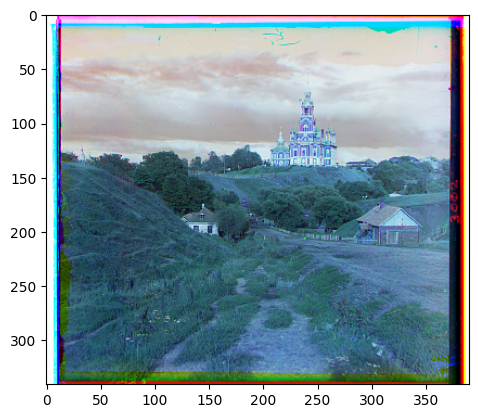

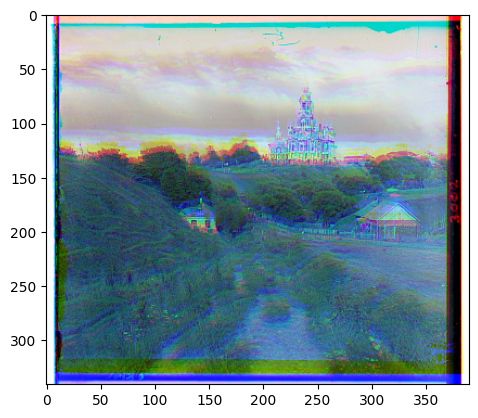

(141, 196)
(141, 196)
(141, 196)
(141, 196)


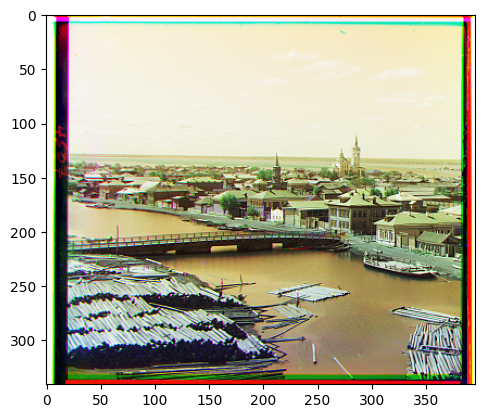

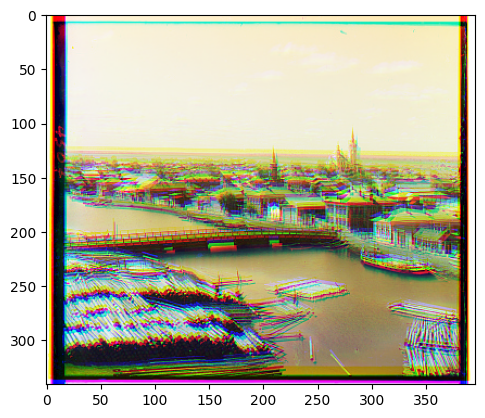

(141, 191)
(141, 191)
(141, 191)
(141, 191)


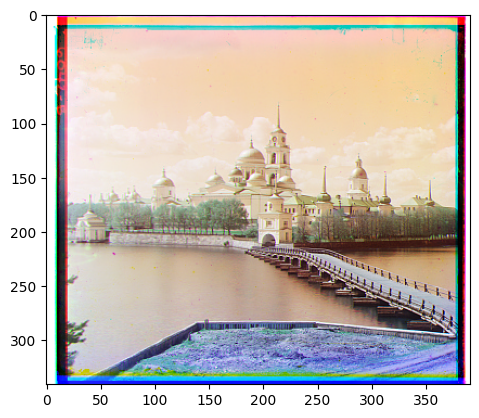

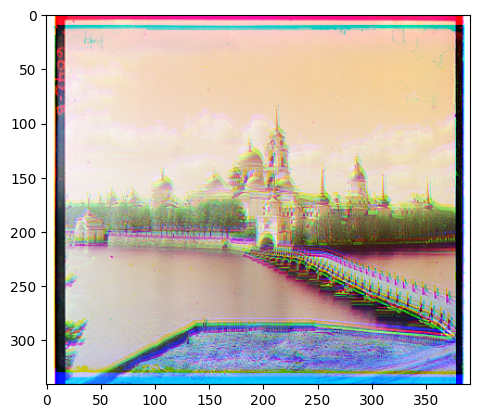

In [ ]:
filenames = ['cathedral', 'tobolsk', 'monastery'] # ['stone_gate', 'train', 'mosque']

for file in filenames:
  filename = file + '.jpg'
  im = skio.imread(filename)
  im = normalize(im)
  b, g, r = split_channels(im)

  cropped_b = crop_img(b, 100, 100, 100, 100)
  cropped_g = crop_img(g, 100, 100, 100, 100)
  cropped_r = crop_img(r, 100, 100, 100, 100)

  g_i_shift, g_j_shift = align(cropped_g, cropped_b)
  r_i_shift, r_j_shift = align(cropped_r, cropped_b)

  g_aligned = np.roll(g, g_i_shift, axis=0)
  g_aligned = np.roll(g_aligned, g_j_shift, axis=1)

  r_aligned = np.roll(r, r_i_shift, axis=0)
  r_aligned = np.roll(r_aligned, r_j_shift, axis=1)

  im_out = np.dstack([b, g_aligned, r_aligned])
  im_naive = np.dstack([b, g, r])
  plt.imshow(im_out)
  plt.show()
  plt.imshow(im_naive)
  plt.show()

  fname = file + '_aligned' + '.jpg'
  plt.imsave(fname, im_out)

  with open("jpg_shifts.txt", "a") as f:
    string = file + ": " + "G shift: (" + str(g_i_shift) + "," + str(g_j_shift) + ")" + "R shift: (" + str(r_i_shift) + "," + str(r_j_shift) + ") " + "\n"
    f.write(string)

  fname = file + '_naive' + '.jpg'
  plt.imsave(fname, im_naive)

# TIF - approach

In [ ]:
im = skio.imread('lugano.tif')

Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  5
78
78
(78, 98)
(78, 98)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  4
156
156
(156, 196)
(156, 196)
i_shift:  0
j_shift:  -1
Current i_offset:  2
Current j_offset:  -2
Level:  3
312
312
(312, 392)
(312, 392)
i_shift:  3
j_shift:  0
Current i_offset:  8
Current j_offset:  -2
Level:  2
623
623
(623, 783)
(623, 783)
i_shift:  2
j_shift:  -2
Current i_offset:  12
Current j_offset:  -6
Level:  1
1245
1245
(1245, 1566)
(1245, 1566)
i_shift:  7
j_shift:  -2
Current i_offset:  26
Current j_offset:  -10
Level:  0
2490
2490
(2490, 3131)
(2490, 3131)
i_shift:  7
j_shift:  -7
Current i_offset:  40
Current j_offset:  -24
Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 98)
(78, 98)
i_shift:  1
j_shift:  -1
Current i_offset:  4
Current j_offset:  -2
Level:  4
156
156
(156, 196)
(156, 196)
i_

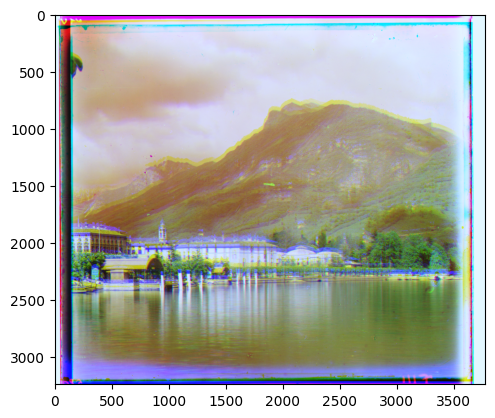

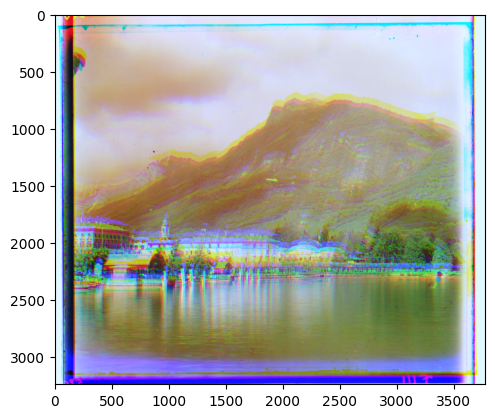

Level:  6
39
39
(39, 48)
(39, 48)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  5
78
78
(78, 96)
(78, 96)
i_shift:  1
j_shift:  1
Current i_offset:  2
Current j_offset:  2
Level:  4
155
155
(155, 192)
(155, 192)
i_shift:  1
j_shift:  -1
Current i_offset:  4
Current j_offset:  0
Level:  3
309
309
(309, 383)
(309, 383)
i_shift:  2
j_shift:  3
Current i_offset:  8
Current j_offset:  6
Level:  2
618
618
(618, 766)
(618, 766)
i_shift:  4
j_shift:  0
Current i_offset:  16
Current j_offset:  6
Level:  1
1235
1235
(1235, 1531)
(1235, 1531)
i_shift:  7
j_shift:  6
Current i_offset:  30
Current j_offset:  18
Level:  0
2469
2469
(2469, 3062)
(2469, 3062)
i_shift:  7
j_shift:  3
Current i_offset:  44
Current j_offset:  24
Level:  6
39
39
(39, 48)
(39, 48)
i_shift:  1
j_shift:  -8
Current i_offset:  2
Current j_offset:  -16
Level:  5
78
78
(78, 96)
(78, 96)
i_shift:  0
j_shift:  -6
Current i_offset:  2
Current j_offset:  -28
Level:  4
155
155
(155, 192)
(155, 192)
i_shif

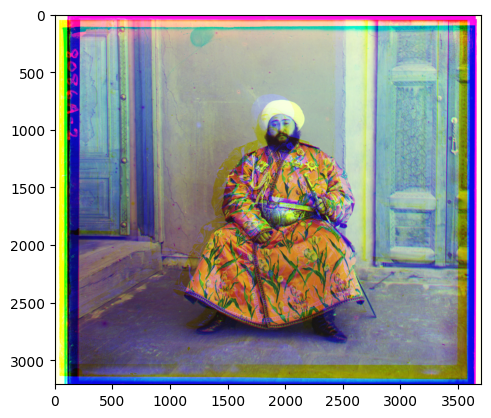

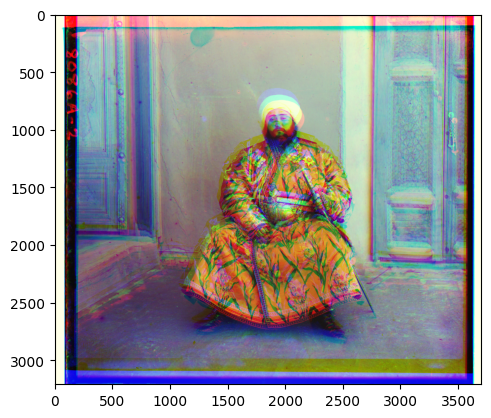

Level:  6
39
39
(39, 48)
(39, 48)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 96)
(78, 96)
i_shift:  0
j_shift:  1
Current i_offset:  2
Current j_offset:  2
Level:  4
156
156
(156, 191)
(156, 191)
i_shift:  2
j_shift:  -1
Current i_offset:  6
Current j_offset:  0
Level:  3
311
311
(311, 381)
(311, 381)
i_shift:  1
j_shift:  2
Current i_offset:  8
Current j_offset:  4
Level:  2
621
621
(621, 761)
(621, 761)
i_shift:  7
j_shift:  0
Current i_offset:  22
Current j_offset:  4
Level:  1
1241
1241
(1241, 1521)
(1241, 1521)
i_shift:  7
j_shift:  4
Current i_offset:  36
Current j_offset:  12
Level:  0
2482
2482
(2482, 3041)
(2482, 3041)
i_shift:  7
j_shift:  5
Current i_offset:  50
Current j_offset:  22
Level:  6
39
39
(39, 48)
(39, 48)
i_shift:  2
j_shift:  0
Current i_offset:  4
Current j_offset:  0
Level:  5
78
78
(78, 96)
(78, 96)
i_shift:  0
j_shift:  0
Current i_offset:  4
Current j_offset:  0
Level:  4
156
156
(156, 191)
(156, 191)
i_shift:  4


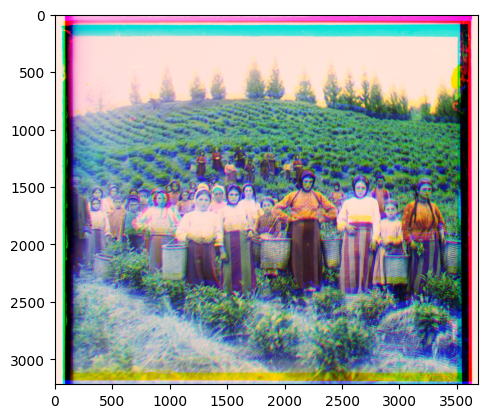

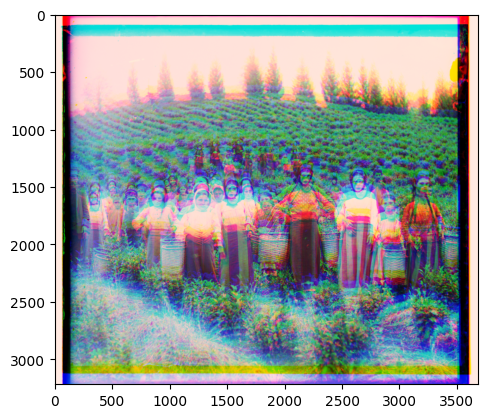

Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 97)
(78, 97)
i_shift:  -1
j_shift:  1
Current i_offset:  0
Current j_offset:  2
Level:  4
156
156
(156, 194)
(156, 194)
i_shift:  3
j_shift:  -1
Current i_offset:  6
Current j_offset:  0
Level:  3
312
312
(312, 387)
(312, 387)
i_shift:  -1
j_shift:  2
Current i_offset:  4
Current j_offset:  4
Level:  2
624
624
(624, 774)
(624, 774)
i_shift:  6
j_shift:  0
Current i_offset:  16
Current j_offset:  4
Level:  1
1248
1248
(1248, 1547)
(1248, 1547)
i_shift:  4
j_shift:  4
Current i_offset:  24
Current j_offset:  12
Level:  0
2496
2496
(2496, 3093)
(2496, 3093)
i_shift:  7
j_shift:  5
Current i_offset:  38
Current j_offset:  22
Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 97)
(78, 97)
i_shift:  1
j_shift:  1
Current i_offset:  4
Current j_offset:  2
Level:  4
156
156
(156, 194)
(156, 194)
i_shift:  

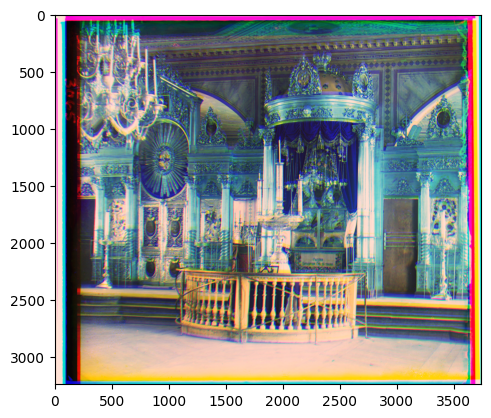

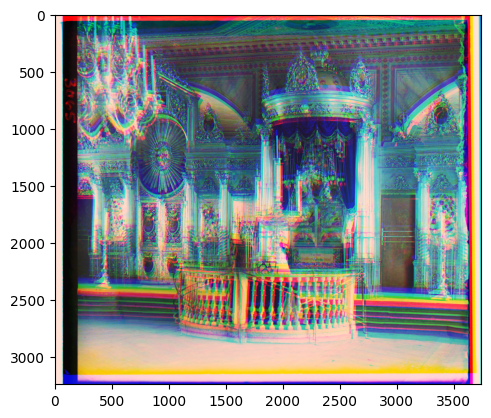

Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  5
78
78
(78, 97)
(78, 97)
i_shift:  1
j_shift:  1
Current i_offset:  2
Current j_offset:  2
Level:  4
156
156
(156, 193)
(156, 193)
i_shift:  0
j_shift:  -1
Current i_offset:  2
Current j_offset:  0
Level:  3
312
312
(312, 385)
(312, 385)
i_shift:  3
j_shift:  3
Current i_offset:  8
Current j_offset:  6
Level:  2
623
623
(623, 769)
(623, 769)
i_shift:  1
j_shift:  -1
Current i_offset:  10
Current j_offset:  4
Level:  1
1245
1245
(1245, 1537)
(1245, 1537)
i_shift:  7
j_shift:  6
Current i_offset:  24
Current j_offset:  16
Level:  0
2489
2489
(2489, 3073)
(2489, 3073)
i_shift:  7
j_shift:  4
Current i_offset:  38
Current j_offset:  24
Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  1
j_shift:  1
Current i_offset:  2
Current j_offset:  2
Level:  5
78
78
(78, 97)
(78, 97)
i_shift:  0
j_shift:  -1
Current i_offset:  2
Current j_offset:  0
Level:  4
156
156
(156, 193)
(156, 193)
i_shift:  

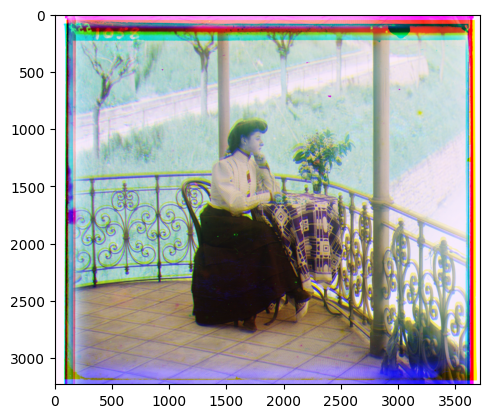

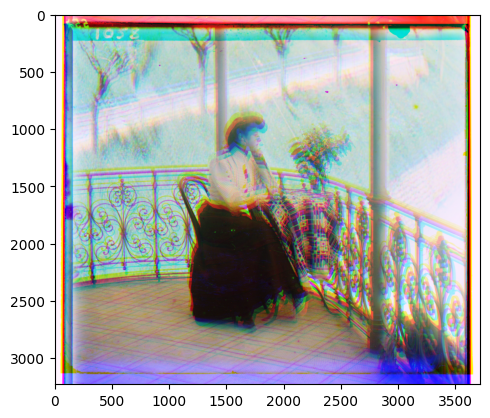

Level:  6
40
40
(40, 48)
(40, 48)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  5
79
79
(79, 96)
(79, 96)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  4
157
157
(157, 191)
(157, 191)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  3
313
313
(313, 382)
(313, 382)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  2
626
626
(626, 763)
(626, 763)
i_shift:  -1
j_shift:  0
Current i_offset:  -2
Current j_offset:  0
Level:  1
1251
1251
(1251, 1526)
(1251, 1526)
i_shift:  1
j_shift:  -1
Current i_offset:  0
Current j_offset:  -2
Level:  0
2501
2501
(2501, 3052)
(2501, 3052)
i_shift:  -2
j_shift:  0
Current i_offset:  -4
Current j_offset:  -2
Level:  6
40
40
(40, 48)
(40, 48)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
79
79
(79, 96)
(79, 96)
i_shift:  0
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  4
157
157
(157, 191)
(157, 191)
i_shift:  2

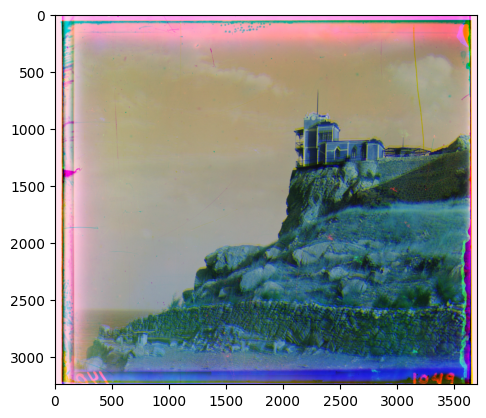

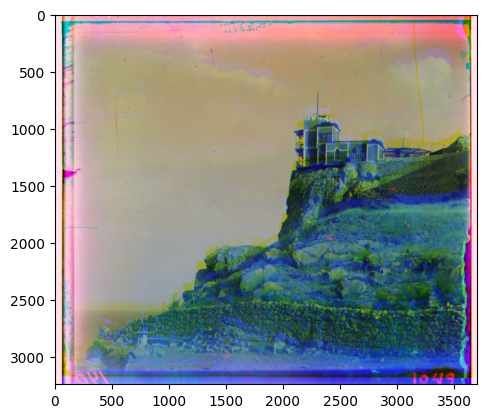

Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 98)
(78, 98)
i_shift:  1
j_shift:  0
Current i_offset:  4
Current j_offset:  0
Level:  4
156
156
(156, 196)
(156, 196)
i_shift:  1
j_shift:  1
Current i_offset:  6
Current j_offset:  2
Level:  3
311
311
(311, 391)
(311, 391)
i_shift:  4
j_shift:  -1
Current i_offset:  14
Current j_offset:  0
Level:  2
622
622
(622, 781)
(622, 781)
i_shift:  6
j_shift:  2
Current i_offset:  26
Current j_offset:  4
Level:  1
1244
1244
(1244, 1561)
(1244, 1561)
i_shift:  7
j_shift:  -2
Current i_offset:  40
Current j_offset:  0
Level:  0
2487
2487
(2487, 3122)
(2487, 3122)
i_shift:  7
j_shift:  3
Current i_offset:  54
Current j_offset:  6
Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  3
j_shift:  0
Current i_offset:  6
Current j_offset:  0
Level:  5
78
78
(78, 98)
(78, 98)
i_shift:  0
j_shift:  1
Current i_offset:  6
Current j_offset:  2
Level:  4
156
156
(156, 196)
(156, 196)
i_shift:  5


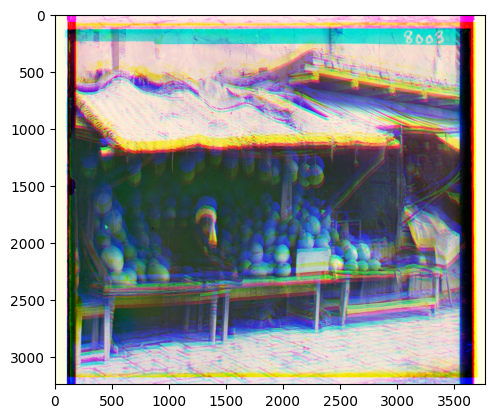

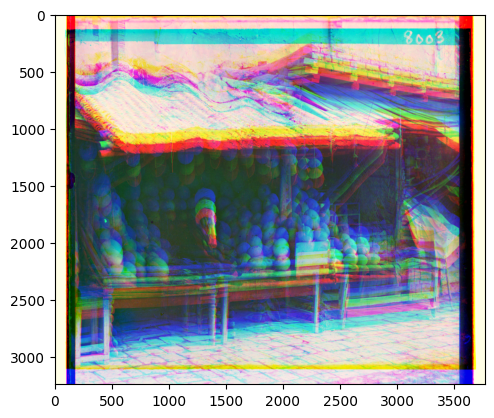

Level:  6
39
39
(39, 50)
(39, 50)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 99)
(78, 99)
i_shift:  0
j_shift:  1
Current i_offset:  2
Current j_offset:  2
Level:  4
156
156
(156, 198)
(156, 198)
i_shift:  3
j_shift:  0
Current i_offset:  8
Current j_offset:  2
Level:  3
312
312
(312, 395)
(312, 395)
i_shift:  2
j_shift:  2
Current i_offset:  12
Current j_offset:  6
Level:  2
623
623
(623, 790)
(623, 790)
i_shift:  7
j_shift:  1
Current i_offset:  26
Current j_offset:  8
Level:  1
1245
1245
(1245, 1580)
(1245, 1580)
i_shift:  7
j_shift:  5
Current i_offset:  40
Current j_offset:  18
Level:  0
2489
2489
(2489, 3160)
(2489, 3160)
i_shift:  7
j_shift:  2
Current i_offset:  54
Current j_offset:  22
Level:  6
39
39
(39, 50)
(39, 50)
i_shift:  3
j_shift:  1
Current i_offset:  6
Current j_offset:  2
Level:  5
78
78
(78, 99)
(78, 99)
i_shift:  -1
j_shift:  -1
Current i_offset:  4
Current j_offset:  0
Level:  4
156
156
(156, 198)
(156, 198)
i_shift:  

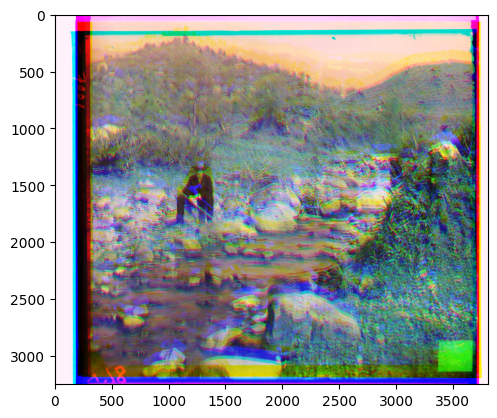

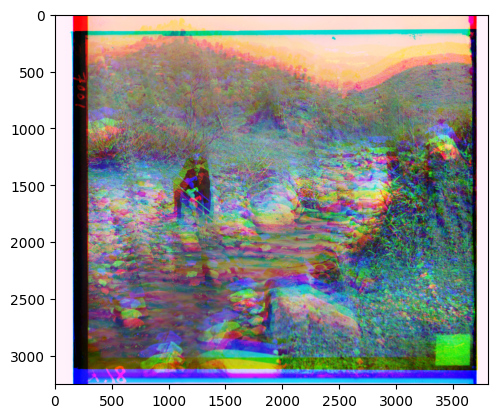

Level:  6
39
39
(39, 50)
(39, 50)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 99)
(78, 99)
i_shift:  0
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  4
156
156
(156, 198)
(156, 198)
i_shift:  1
j_shift:  0
Current i_offset:  4
Current j_offset:  0
Level:  3
311
311
(311, 396)
(311, 396)
i_shift:  2
j_shift:  -1
Current i_offset:  8
Current j_offset:  -2
Level:  2
622
622
(622, 792)
(622, 792)
i_shift:  4
j_shift:  0
Current i_offset:  16
Current j_offset:  -2
Level:  1
1244
1244
(1244, 1584)
(1244, 1584)
i_shift:  7
j_shift:  -1
Current i_offset:  30
Current j_offset:  -4
Level:  0
2488
2488
(2488, 3167)
(2488, 3167)
i_shift:  7
j_shift:  -3
Current i_offset:  44
Current j_offset:  -10
Level:  6
39
39
(39, 50)
(39, 50)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 99)
(78, 99)
i_shift:  1
j_shift:  -1
Current i_offset:  4
Current j_offset:  -2
Level:  4
156
156
(156, 198)
(156, 198)
i_shi

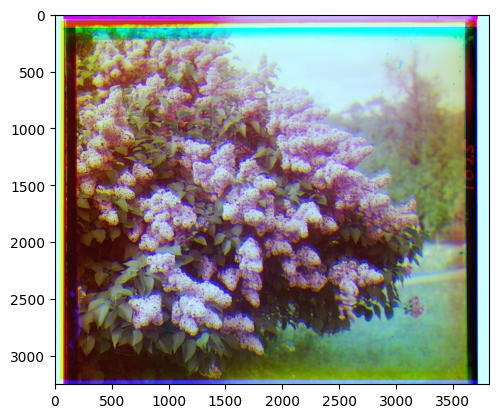

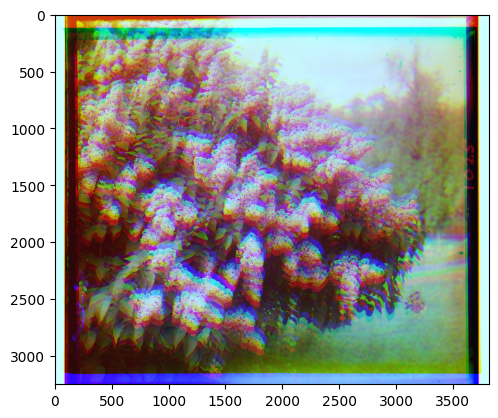

Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  5
78
78
(78, 97)
(78, 97)
i_shift:  0
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  4
155
155
(155, 193)
(155, 193)
i_shift:  1
j_shift:  1
Current i_offset:  4
Current j_offset:  2
Level:  3
309
309
(309, 385)
(309, 385)
i_shift:  3
j_shift:  0
Current i_offset:  10
Current j_offset:  2
Level:  2
617
617
(617, 769)
(617, 769)
i_shift:  3
j_shift:  1
Current i_offset:  16
Current j_offset:  4
Level:  1
1234
1234
(1234, 1537)
(1234, 1537)
i_shift:  7
j_shift:  2
Current i_offset:  30
Current j_offset:  8
Level:  0
2467
2467
(2467, 3074)
(2467, 3074)
i_shift:  7
j_shift:  5
Current i_offset:  44
Current j_offset:  18
Level:  6
39
39
(39, 49)
(39, 49)
i_shift:  2
j_shift:  0
Current i_offset:  4
Current j_offset:  0
Level:  5
78
78
(78, 97)
(78, 97)
i_shift:  -1
j_shift:  0
Current i_offset:  2
Current j_offset:  0
Level:  4
155
155
(155, 193)
(155, 193)
i_shift:  5


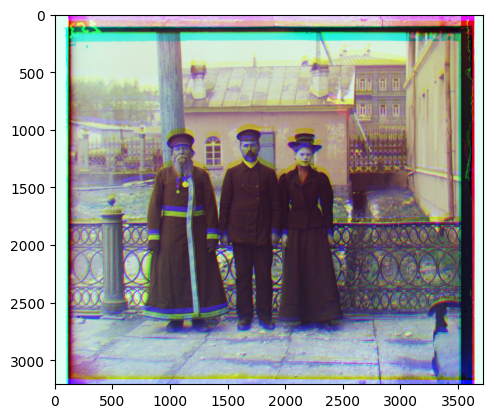

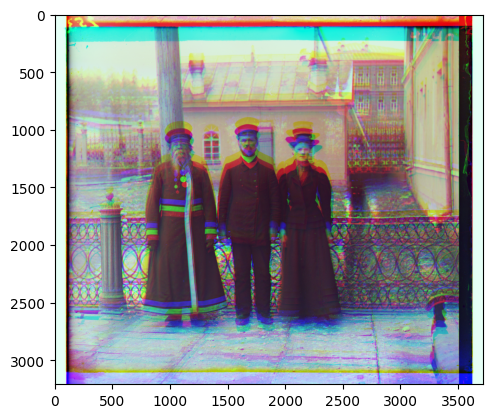

In [ ]:
from re import search
filenames = ['lugano', 'emir', 'harvesters', 'icon', 'italil', 'lastochikino', 'melons', 'self_portrait', 'siren', 'three_generations']
levels = 7
search_area = 8


for file in filenames:
  filename = file + '.tif'
  im = skio.imread(filename)
  im = im2uint8(im)
  im = normalize(im)
  ch = split_channels(im)

  # normalize saturation of color chanels (e.g. for emir picture)
  means = np.array([c.mean() for c in ch])
  target = means.mean()
  gains = np.divide(target, means, out=np.ones_like(means), where=means>1e-8)

  b, g, r = [np.clip(c * g, 0.0, 1.0) for c, g in zip(ch, gains)]

  w, h = b.shape[0], b.shape[1]
  w_crop, h_crop = int(0.1*w), int(0.1*h)
  b_cropped, g_cropped, r_cropped = crop_img(b, w_crop, h_crop, w_crop, h_crop), crop_img(g, w_crop, h_crop, w_crop, h_crop), crop_img(r, w_crop, h_crop, w_crop, h_crop)


  b_pyramid = get_pyramid(b_cropped, levels)
  g_pyramid = get_pyramid(g_cropped, levels)
  r_pyramid = get_pyramid(r_cropped, levels)

  g_i_shift, g_j_shift = align_with_pyramid(g_pyramid, b_pyramid, levels, search_area)
  r_i_shift, r_j_shift = align_with_pyramid(r_pyramid, b_pyramid, levels, search_area)

  g_aligned = np.roll(g, g_i_shift, axis=0)
  g_aligned = np.roll(g_aligned, g_j_shift, axis=1)

  r_aligned = np.roll(r, r_i_shift, axis=0)
  r_aligned = np.roll(r_aligned, r_j_shift, axis=1)

  im_out = np.dstack([b, g_aligned, r_aligned])
  im_naive = np.dstack([b, g, r])
  plt.imshow(im_out)
  plt.show()
  plt.imshow(im_naive)
  plt.show()

  fname = file + '_aligned' + '.jpg'
  plt.imsave(fname, im_out)

  with open("tif_shifts.txt", "a") as f:
    string = file + ": " + "G shift: (" + str(g_i_shift) + "," + str(g_j_shift) + ")" + "R shift: (" + str(r_i_shift) + "," + str(r_j_shift) + ") " + "\n"
    f.write(string)

  fname = file + '_naive' + '.jpg'
  plt.imsave(fname, im_naive)

# Edges

Level:  4
156
156
(156, 196)
(156, 196)
i_shift:  2
j_shift:  -1
Current i_offset:  4
Current j_offset:  -2
Level:  3
312
312
(312, 392)
(312, 392)
i_shift:  1
j_shift:  0
Current i_offset:  6
Current j_offset:  -2
Level:  2
623
623
(623, 783)
(623, 783)
i_shift:  4
j_shift:  -2
Current i_offset:  14
Current j_offset:  -6
Level:  1
1245
1245
(1245, 1566)
(1245, 1566)
i_shift:  6
j_shift:  -2
Current i_offset:  26
Current j_offset:  -10
Level:  0
2490
2490
(2490, 3131)
(2490, 3131)
i_shift:  9
j_shift:  -7
Current i_offset:  44
Current j_offset:  -24
Level:  4
156
156
(156, 196)
(156, 196)
i_shift:  6
j_shift:  -2
Current i_offset:  12
Current j_offset:  -4
Level:  3
312
312
(312, 392)
(312, 392)
i_shift:  0
j_shift:  0
Current i_offset:  12
Current j_offset:  -4
Level:  2
623
623
(623, 783)
(623, 783)
i_shift:  9
j_shift:  -3
Current i_offset:  30
Current j_offset:  -10
Level:  1
1245
1245
(1245, 1566)
(1245, 1566)
i_shift:  9
j_shift:  -5
Current i_offset:  48
Current j_offset:  -20
L

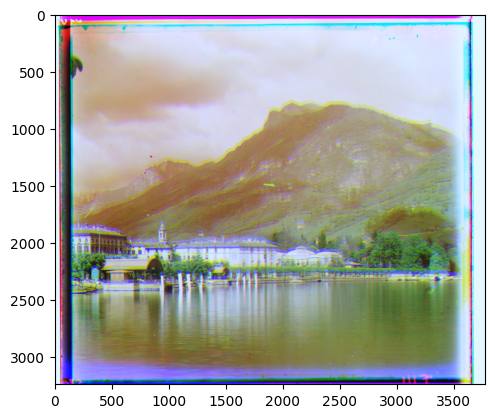

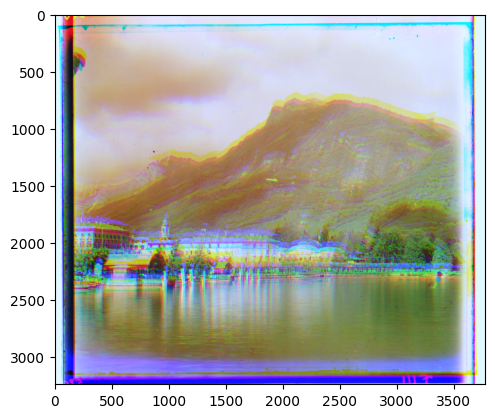

Level:  4
155
155
(155, 192)
(155, 192)
i_shift:  3
j_shift:  2
Current i_offset:  6
Current j_offset:  4
Level:  3
309
309
(309, 383)
(309, 383)
i_shift:  0
j_shift:  -1
Current i_offset:  6
Current j_offset:  2
Level:  2
618
618
(618, 766)
(618, 766)
i_shift:  6
j_shift:  4
Current i_offset:  18
Current j_offset:  10
Level:  1
1235
1235
(1235, 1531)
(1235, 1531)
i_shift:  7
j_shift:  2
Current i_offset:  32
Current j_offset:  14
Level:  0
2469
2469
(2469, 3062)
(2469, 3062)
i_shift:  9
j_shift:  6
Current i_offset:  50
Current j_offset:  26
Level:  4
155
155
(155, 192)
(155, 192)
i_shift:  6
j_shift:  2
Current i_offset:  12
Current j_offset:  4
Level:  3
309
309
(309, 383)
(309, 383)
i_shift:  1
j_shift:  1
Current i_offset:  14
Current j_offset:  6
Level:  2
618
618
(618, 766)
(618, 766)
i_shift:  9
j_shift:  4
Current i_offset:  32
Current j_offset:  14
Level:  1
1235
1235
(1235, 1531)
(1235, 1531)
i_shift:  9
j_shift:  6
Current i_offset:  50
Current j_offset:  26
Level:  0
2469


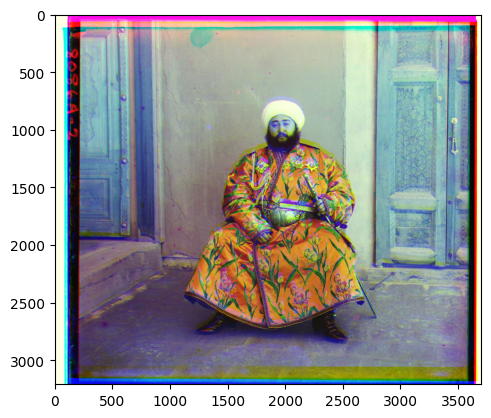

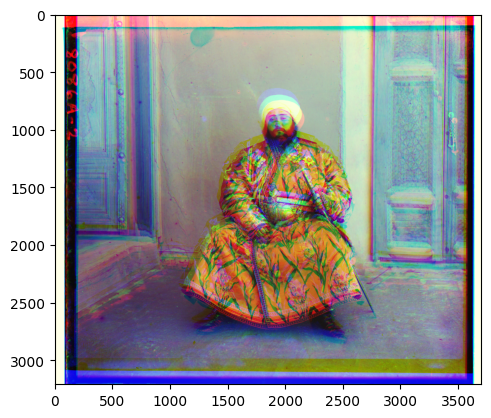

Level:  4
156
156
(156, 191)
(156, 191)
i_shift:  4
j_shift:  1
Current i_offset:  8
Current j_offset:  2
Level:  3
311
311
(311, 381)
(311, 381)
i_shift:  -1
j_shift:  0
Current i_offset:  6
Current j_offset:  2
Level:  2
621
621
(621, 761)
(621, 761)
i_shift:  9
j_shift:  2
Current i_offset:  24
Current j_offset:  6
Level:  1
1241
1241
(1241, 1521)
(1241, 1521)
i_shift:  6
j_shift:  3
Current i_offset:  36
Current j_offset:  12
Level:  0
2482
2482
(2482, 3041)
(2482, 3041)
i_shift:  9
j_shift:  8
Current i_offset:  54
Current j_offset:  28
Level:  4
156
156
(156, 191)
(156, 191)
i_shift:  8
j_shift:  1
Current i_offset:  16
Current j_offset:  2
Level:  3
311
311
(311, 381)
(311, 381)
i_shift:  0
j_shift:  0
Current i_offset:  16
Current j_offset:  2
Level:  2
621
621
(621, 761)
(621, 761)
i_shift:  9
j_shift:  2
Current i_offset:  34
Current j_offset:  6
Level:  1
1241
1241
(1241, 1521)
(1241, 1521)
i_shift:  9
j_shift:  1
Current i_offset:  52
Current j_offset:  8
Level:  0
2482
248

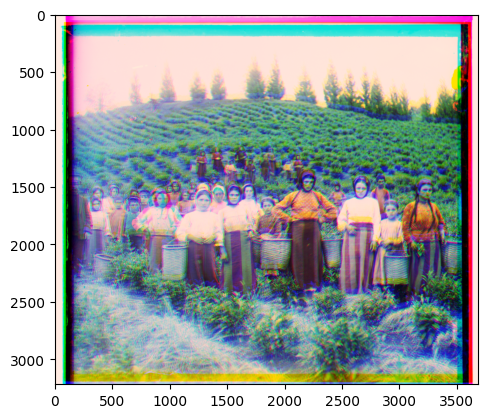

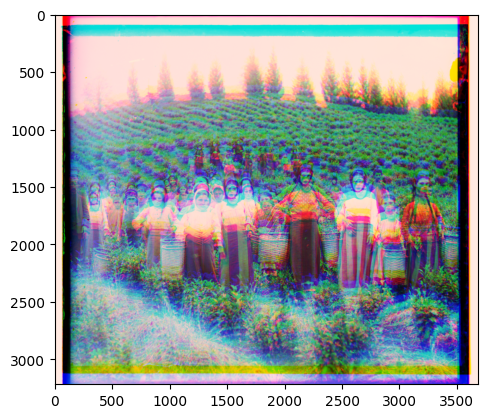

Level:  4
156
156
(156, 194)
(156, 194)
i_shift:  3
j_shift:  1
Current i_offset:  6
Current j_offset:  2
Level:  3
312
312
(312, 387)
(312, 387)
i_shift:  -1
j_shift:  0
Current i_offset:  4
Current j_offset:  2
Level:  2
624
624
(624, 774)
(624, 774)
i_shift:  7
j_shift:  2
Current i_offset:  18
Current j_offset:  6
Level:  1
1248
1248
(1248, 1547)
(1248, 1547)
i_shift:  3
j_shift:  2
Current i_offset:  24
Current j_offset:  10
Level:  0
2496
2496
(2496, 3093)
(2496, 3093)
i_shift:  9
j_shift:  7
Current i_offset:  42
Current j_offset:  24
Level:  4
156
156
(156, 194)
(156, 194)
i_shift:  6
j_shift:  1
Current i_offset:  12
Current j_offset:  2
Level:  3
312
312
(312, 387)
(312, 387)
i_shift:  -1
j_shift:  1
Current i_offset:  10
Current j_offset:  4
Level:  2
624
624
(624, 774)
(624, 774)
i_shift:  9
j_shift:  2
Current i_offset:  28
Current j_offset:  8
Level:  1
1248
1248
(1248, 1547)
(1248, 1547)
i_shift:  9
j_shift:  3
Current i_offset:  46
Current j_offset:  14
Level:  0
2496
2

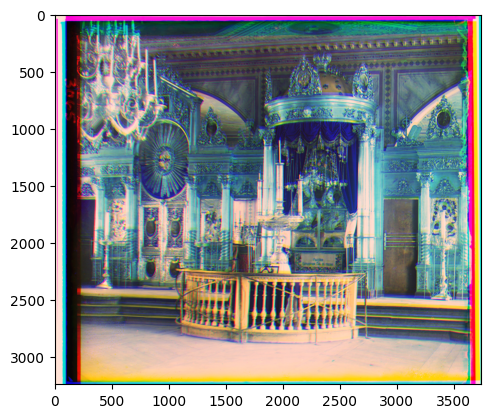

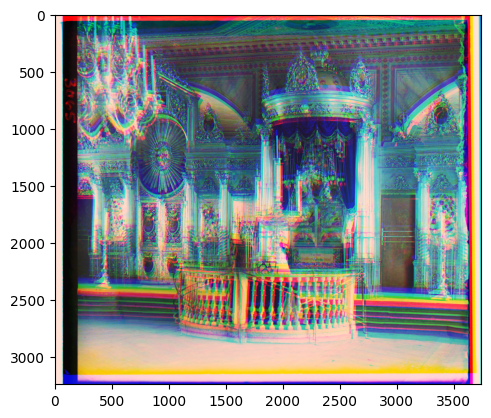

Level:  4
156
156
(156, 193)
(156, 193)
i_shift:  2
j_shift:  1
Current i_offset:  4
Current j_offset:  2
Level:  3
312
312
(312, 385)
(312, 385)
i_shift:  1
j_shift:  1
Current i_offset:  6
Current j_offset:  4
Level:  2
623
623
(623, 769)
(623, 769)
i_shift:  3
j_shift:  1
Current i_offset:  12
Current j_offset:  6
Level:  1
1245
1245
(1245, 1537)
(1245, 1537)
i_shift:  7
j_shift:  5
Current i_offset:  26
Current j_offset:  16
Level:  0
2489
2489
(2489, 3073)
(2489, 3073)
i_shift:  9
j_shift:  6
Current i_offset:  44
Current j_offset:  28
Level:  4
156
156
(156, 193)
(156, 193)
i_shift:  5
j_shift:  2
Current i_offset:  10
Current j_offset:  4
Level:  3
312
312
(312, 385)
(312, 385)
i_shift:  0
j_shift:  0
Current i_offset:  10
Current j_offset:  4
Level:  2
623
623
(623, 769)
(623, 769)
i_shift:  9
j_shift:  5
Current i_offset:  28
Current j_offset:  14
Level:  1
1245
1245
(1245, 1537)
(1245, 1537)
i_shift:  9
j_shift:  4
Current i_offset:  46
Current j_offset:  22
Level:  0
2489
24

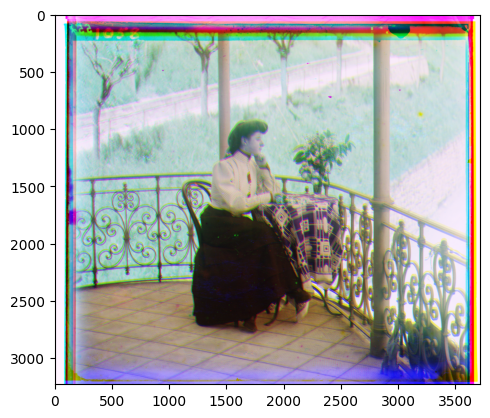

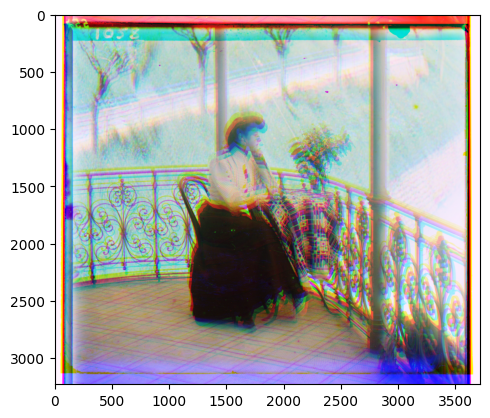

Level:  4
157
157
(157, 191)
(157, 191)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  3
313
313
(313, 382)
(313, 382)
i_shift:  0
j_shift:  0
Current i_offset:  0
Current j_offset:  0
Level:  2
626
626
(626, 763)
(626, 763)
i_shift:  -1
j_shift:  0
Current i_offset:  -2
Current j_offset:  0
Level:  1
1251
1251
(1251, 1526)
(1251, 1526)
i_shift:  1
j_shift:  -1
Current i_offset:  0
Current j_offset:  -2
Level:  0
2501
2501
(2501, 3052)
(2501, 3052)
i_shift:  -3
j_shift:  0
Current i_offset:  -6
Current j_offset:  -2
Level:  4
157
157
(157, 191)
(157, 191)
i_shift:  5
j_shift:  -1
Current i_offset:  10
Current j_offset:  -2
Level:  3
313
313
(313, 382)
(313, 382)
i_shift:  -1
j_shift:  1
Current i_offset:  8
Current j_offset:  0
Level:  2
626
626
(626, 763)
(626, 763)
i_shift:  9
j_shift:  -2
Current i_offset:  26
Current j_offset:  -4
Level:  1
1251
1251
(1251, 1526)
(1251, 1526)
i_shift:  9
j_shift:  0
Current i_offset:  44
Current j_offset:  -4
Level:  0
25

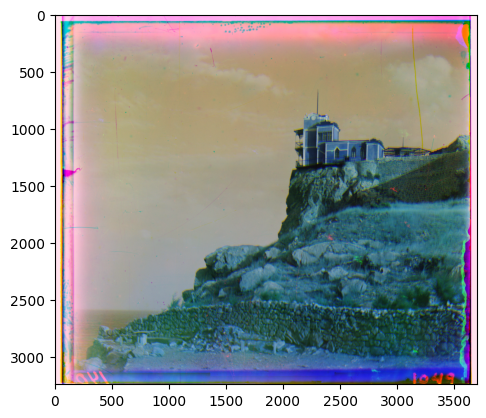

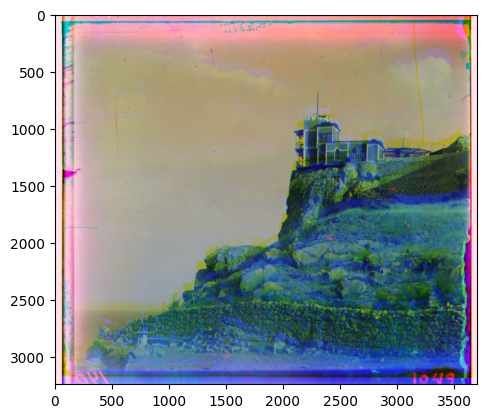

Level:  4
156
156
(156, 196)
(156, 196)
i_shift:  5
j_shift:  1
Current i_offset:  10
Current j_offset:  2
Level:  3
311
311
(311, 391)
(311, 391)
i_shift:  0
j_shift:  -1
Current i_offset:  10
Current j_offset:  0
Level:  2
622
622
(622, 781)
(622, 781)
i_shift:  9
j_shift:  2
Current i_offset:  28
Current j_offset:  4
Level:  1
1244
1244
(1244, 1561)
(1244, 1561)
i_shift:  9
j_shift:  -2
Current i_offset:  46
Current j_offset:  0
Level:  0
2487
2487
(2487, 3122)
(2487, 3122)
i_shift:  9
j_shift:  9
Current i_offset:  64
Current j_offset:  18
Level:  4
156
156
(156, 196)
(156, 196)
i_shift:  9
j_shift:  0
Current i_offset:  18
Current j_offset:  0
Level:  3
311
311
(311, 391)
(311, 391)
i_shift:  4
j_shift:  1
Current i_offset:  26
Current j_offset:  2
Level:  2
622
622
(622, 781)
(622, 781)
i_shift:  9
j_shift:  1
Current i_offset:  44
Current j_offset:  4
Level:  1
1244
1244
(1244, 1561)
(1244, 1561)
i_shift:  9
j_shift:  4
Current i_offset:  62
Current j_offset:  12
Level:  0
2487


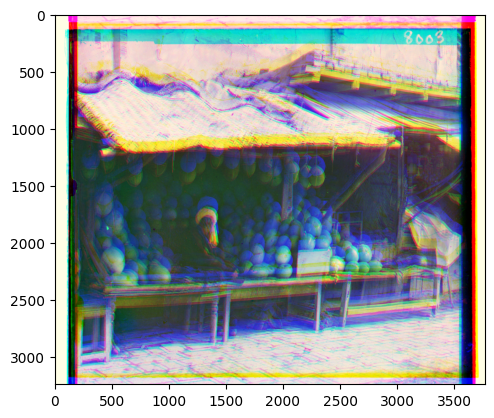

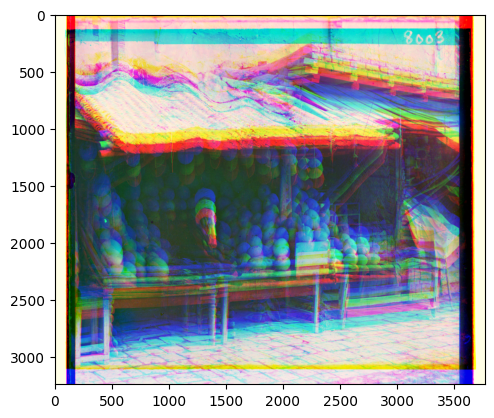

Level:  4
156
156
(156, 198)
(156, 198)
i_shift:  5
j_shift:  2
Current i_offset:  10
Current j_offset:  4
Level:  3
312
312
(312, 395)
(312, 395)
i_shift:  0
j_shift:  0
Current i_offset:  10
Current j_offset:  4
Level:  2
623
623
(623, 790)
(623, 790)
i_shift:  9
j_shift:  3
Current i_offset:  28
Current j_offset:  10
Level:  1
1245
1245
(1245, 1580)
(1245, 1580)
i_shift:  9
j_shift:  3
Current i_offset:  46
Current j_offset:  16
Level:  0
2489
2489
(2489, 3160)
(2489, 3160)
i_shift:  9
j_shift:  9
Current i_offset:  64
Current j_offset:  34
Level:  4
156
156
(156, 198)
(156, 198)
i_shift:  9
j_shift:  2
Current i_offset:  18
Current j_offset:  4
Level:  3
312
312
(312, 395)
(312, 395)
i_shift:  4
j_shift:  1
Current i_offset:  26
Current j_offset:  6
Level:  2
623
623
(623, 790)
(623, 790)
i_shift:  9
j_shift:  3
Current i_offset:  44
Current j_offset:  12
Level:  1
1245
1245
(1245, 1580)
(1245, 1580)
i_shift:  9
j_shift:  9
Current i_offset:  62
Current j_offset:  30
Level:  0
2489

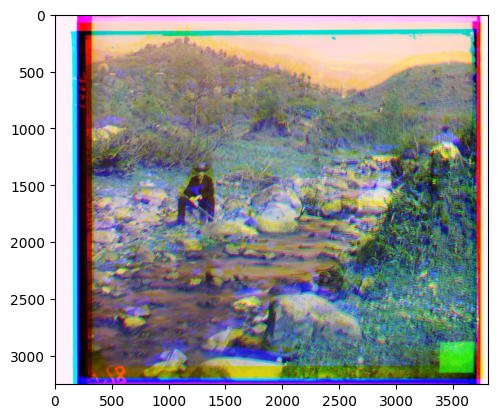

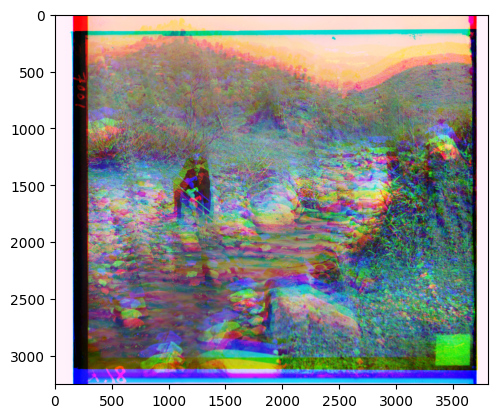

Level:  4
156
156
(156, 198)
(156, 198)
i_shift:  3
j_shift:  0
Current i_offset:  6
Current j_offset:  0
Level:  3
311
311
(311, 396)
(311, 396)
i_shift:  0
j_shift:  -1
Current i_offset:  6
Current j_offset:  -2
Level:  2
622
622
(622, 792)
(622, 792)
i_shift:  6
j_shift:  0
Current i_offset:  18
Current j_offset:  -2
Level:  1
1244
1244
(1244, 1584)
(1244, 1584)
i_shift:  6
j_shift:  -1
Current i_offset:  30
Current j_offset:  -4
Level:  0
2488
2488
(2488, 3167)
(2488, 3167)
i_shift:  9
j_shift:  -4
Current i_offset:  48
Current j_offset:  -12
Level:  4
156
156
(156, 198)
(156, 198)
i_shift:  6
j_shift:  -2
Current i_offset:  12
Current j_offset:  -4
Level:  3
311
311
(311, 396)
(311, 396)
i_shift:  0
j_shift:  1
Current i_offset:  12
Current j_offset:  -2
Level:  2
622
622
(622, 792)
(622, 792)
i_shift:  9
j_shift:  -5
Current i_offset:  30
Current j_offset:  -12
Level:  1
1244
1244
(1244, 1584)
(1244, 1584)
i_shift:  9
j_shift:  -3
Current i_offset:  48
Current j_offset:  -18
Leve

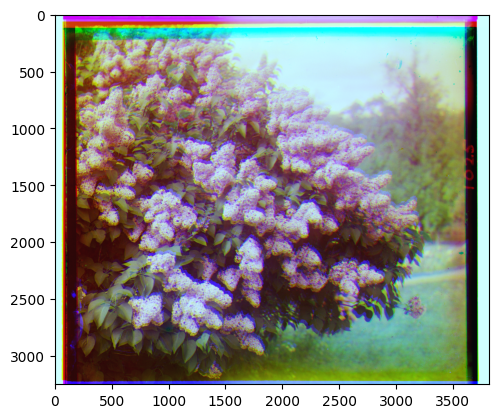

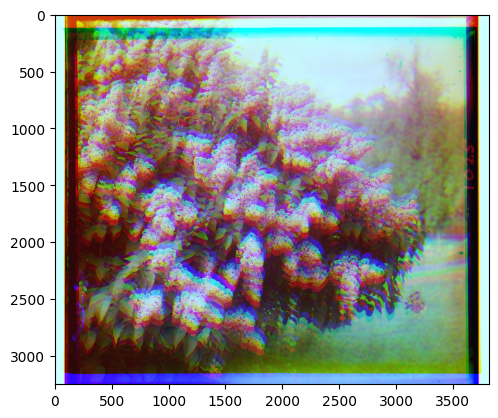

Level:  4
155
155
(155, 193)
(155, 193)
i_shift:  3
j_shift:  1
Current i_offset:  6
Current j_offset:  2
Level:  3
309
309
(309, 385)
(309, 385)
i_shift:  0
j_shift:  0
Current i_offset:  6
Current j_offset:  2
Level:  2
617
617
(617, 769)
(617, 769)
i_shift:  7
j_shift:  1
Current i_offset:  20
Current j_offset:  4
Level:  1
1234
1234
(1234, 1537)
(1234, 1537)
i_shift:  7
j_shift:  2
Current i_offset:  34
Current j_offset:  8
Level:  0
2467
2467
(2467, 3074)
(2467, 3074)
i_shift:  9
j_shift:  4
Current i_offset:  52
Current j_offset:  16
Level:  4
155
155
(155, 193)
(155, 193)
i_shift:  7
j_shift:  1
Current i_offset:  14
Current j_offset:  2
Level:  3
309
309
(309, 385)
(309, 385)
i_shift:  0
j_shift:  -1
Current i_offset:  14
Current j_offset:  0
Level:  2
617
617
(617, 769)
(617, 769)
i_shift:  9
j_shift:  3
Current i_offset:  32
Current j_offset:  6
Level:  1
1234
1234
(1234, 1537)
(1234, 1537)
i_shift:  9
j_shift:  -2
Current i_offset:  50
Current j_offset:  2
Level:  0
2467
246

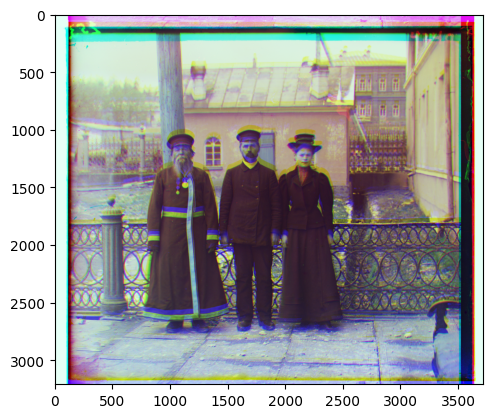

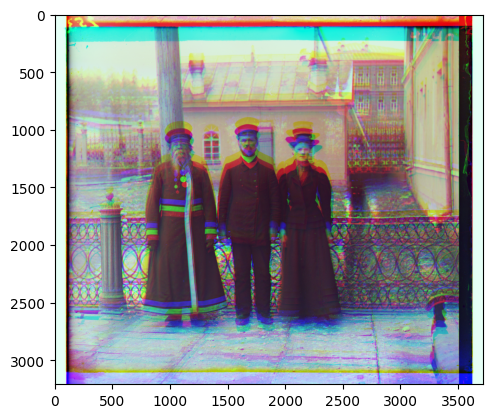

In [ ]:
from re import search
filenames = ['lugano', 'emir', 'harvesters', 'icon', 'italil', 'lastochikino', 'melons', 'self_portrait', 'siren', 'three_generations']
levels = 5
search_area = 10


for file in filenames:
  filename = file + '.tif'
  im = skio.imread(filename)
  im = im2uint8(im)
  im = normalize(im)
  ch = split_channels(im)

  # normalize saturation of color chanels (e.g. for emir picture)
  means = np.array([c.mean() for c in ch])
  target = means.mean()
  gains = np.divide(target, means, out=np.ones_like(means), where=means>1e-8)

  b, g, r = [np.clip(c * g, 0.0, 1.0) for c, g in zip(ch, gains)]

  w, h = b.shape[0], b.shape[1]
  w_crop, h_crop = int(0.1*w), int(0.1*h)
  b_cropped, g_cropped, r_cropped = crop_img(b, w_crop, h_crop, w_crop, h_crop), crop_img(g, w_crop, h_crop, w_crop, h_crop), crop_img(r, w_crop, h_crop, w_crop, h_crop)

  b_pyramid = get_pyramid(b_cropped, levels)
  g_pyramid = get_pyramid(g_cropped, levels)
  r_pyramid = get_pyramid(r_cropped, levels)

  g_i_shift, g_j_shift = align_with_pyramid_and_edge(g_pyramid, b_pyramid, levels, search_area)
  r_i_shift, r_j_shift = align_with_pyramid_and_edge(r_pyramid, b_pyramid, levels, search_area)

  g_aligned = np.roll(g, g_i_shift, axis=0)
  g_aligned = np.roll(g_aligned, g_j_shift, axis=1)

  r_aligned = np.roll(r, r_i_shift, axis=0)
  r_aligned = np.roll(r_aligned, r_j_shift, axis=1)

  im_out = np.dstack([b, g_aligned, r_aligned])
  im_naive = np.dstack([b, g, r])
  plt.imshow(im_out)
  plt.show()
  plt.imshow(im_naive)
  plt.show()

  fname = file + '_aligned_edges' + '.jpg'
  plt.imsave(fname, im_out)

  with open("tif_shifts_edge.txt", "a") as f:
    string = file + ": " + "G shift: (" + str(g_i_shift) + "," + str(g_j_shift) + ")" + "R shift: (" + str(r_i_shift) + "," + str(r_j_shift) + ") " + "\n"
    f.write(string)
